# 0- Setup

In [1]:
for name in dir():
    if not name.startswith('_'):
        del globals()[name]
        
        
%load_ext autoreload
%autoreload 2

#magic commands 

%load_ext autoreload: This command is used to load the autoreload extension, which enables automatic reloading of imported modules before executing each line of code. This is particularly useful during development, as it allows you to make changes to your code without having to manually reload the modules every time.

%autoreload 2: This command sets the autoreload mode to "2", which means that all modules are automatically reloaded every time a top-level module is executed (i.e., when a module is imported or when the main script is run). This mode is more aggressive than the default mode (which only reloads modules that have been explicitly imported using the import statement), but it can be useful in situations where you are frequently changing your code and need to ensure that the latest changes are always being used.

- Naming convention:
  - g: german dataset 
  - int: Initial dataset without anomalies removal
  - GHF: dataset containing onservables 
  - grid: grid containing observables 


# 1- Import libraries

In [2]:
#Logging and Warnings
import warnings  # Provides a way to handle warning messages that may occur during the execution of the code.
import logging  # Module for flexible logging of messages and errors.


#Visualization
import matplotlib.pyplot as plt  # Plotting library for creating various types of plots and visualizations.
import seaborn as sns  # Library for creating statistical graphics, such as heatmaps and scatterplots.
import pygmt  # Python interface to the Generic Mapping Tools (GMT) for creating geospatial visualizations.
import GQ_utils as utils  # Custom module for AFQ utilities.


# File and folders
import os  # Interact with the operating system, such as reading and writing files.
import glob  # Find all the pathnames matching a specified pattern.
from time import sleep  # Functions for working with time and dates.
import pooch  # Download and cache large data files.
import shutil  # Interact with the file system, such as moving, copying, and deleting files and directories.
from pathlib import Path  # Interact with paths and file system objects.
import pandas as pd  # Work with data in tabular form.
from zipfile import ZipFile  # Read and write ZIP files.


# Math
import numpy as np  # Work with arrays and matrices of numerical data.
from scipy import spatial  # Scientific and technical computing functions.
import xarray as xr  # Work with labeled multi-dimensional arrays.
import math  # Mathematical functions.


# Geospatial manipulation
#from osgeo import gdal  # Read and write geospatial data files.
from pygmt.datasets import load_earth_relief  # Access to various geospatial datasets for pygmt.


#Progress Bars and Delay
from time import sleep  # For adding delay.
from tqdm import tqdm_notebook  # For displaying progress bars.



#Logging Configuration and Ignoring Warnings
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Ignore warnings
warnings.filterwarnings('ignore')


#Directory and Styling


DIR = Path().resolve()  # Current working directory.
#sns.set_theme(style="white")  # Set the default theme/style for Seaborn.


C:\Users\Home\anaconda3\envs\GQ\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# 2- Variables and constants

In [3]:
# Constants relative to maps
crs_kwargs = {'crs_to': 'epsg:4326', 'crs_from': 'epsg:4326'}
PROJECTION = 'M5.4i'

Km = 1000

# Map extents of Germany
region_g_tpl = (5.5, 15.5, 47 , 55)
LON_MIN_G, LON_MAX_G, LAT_MIN_G, LAT_MAX_G =  region_g_tpl



In [4]:

# Set global plt parameters
plt_params = {
    'figure.titlesize': 18,
    'axes.titlesize': 16,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.title_fontsize': 13,
    'legend.fontsize': 12,
    'axes.linewidth': 1.2,
    'axes.edgecolor': 'black',
    'axes.titleweight': 'bold',  
    'axes.labelweight': 'bold',  
    'font.weight': 'bold',
    'font.size': 12,
    'grid.color': 'gray',
    'grid.alpha': 0.7,
    #'tick.direction': 'in',
    #'figure.figsize': (8, 6),
    'savefig.dpi': 300,
}


plt.rcParams.update(plt_params)

# Sub figures
sub_figs = list('abcdefghijklmnopqrstuvwxyz123456789')

In [5]:
# create necessary folders
#creates a directory named inside in the current working directory (DIR)

folders_lst = ['Fig', 'Grids', 'Hyperparameters', 
           'Dataset/Preprocessed', 'Dataset/References/a_Moho_Depth', 'Dataset/References/b_LAB', 
           'Dataset/References/c_Volcano', 'Dataset/References/d_VS', 'Dataset/References/e_VP', 
           'Dataset/References/f_CTD', 'Dataset/References/g_Magnetic', 'Dataset/References/h_DEM', 
           'Dataset/References/i_Lithospheric_Rho', 'Dataset/References/j_Sediment', 
            'Dataset/References/k_Free_Air', 'Dataset/References/l_Geoid', 'Dataset/References/m_Bouguer',
            'Dataset/References/n_Shape_Index', 'Dataset/References/o_Stress_Map', 'Dataset/References/p_Heat_Flow',]

#creates directories for each reference inside the 'References' directory
for folder in folders_lst:
    path = os.path.join(DIR, folder)
    Path(path).mkdir(parents=True, exist_ok=True)


### Constants relative to datasets

In [6]:
#Initialize a dictionary called obs with different lists as values.
#obs are organized alphabetically
obs_dict = {
'REF_CODE_UNTRANS': {'BG': 'BG',  'CTD_vb35': 'CTD_vb35',  'DEM': 'DEM',  'MAG_CLASS': 'MAG',  'FA': 'FA',  'GEOID_A': 'GEOID_A',  'LAB': 'LAB',  'MOHO': 'MOHO',  'RHO_L': 'RHO_L',  'SEDIMENT': 'SEDIMENT',  'SI': 'SI',  'VOLCS_DIST_W': 'VOLCS_DIST',  'VP': 'VP_VELOCITY',  'VS': 'VS_VELOCITY',  'STRESS_DIST_W': 'STRESS_DIST'},
'LABELS': {'BG': 'Bouguer Anomaly',  'CTD_vb35': 'Curie Depth',  'DEM': 'DEM',  'MAG_CLASS': 'Magnetic Anomaly',  'FA': 'Free Air Anomaly',  'GEOID_A': 'Geoid',  'LAB': 'LAB Depth',  'MOHO': 'Moho Depth',  'RHO_L': 'Litho. ρ',  'SEDIMENT': 'Sediment Thickness',  'SI': 'Shape Index',  'VOLCS_DIST_W': 'Proximity to Volcano',  'VP': 'Δ$P_v$ @150Km tomography',  'VS': 'Δ$S_v$ @150km tomography',  'STRESS_DIST_W': 'Proximity to Faults'},
'LABELS_gmt': {'BG': 'Bouguer\tAnomaly',  'CTD_vb35': 'Curie\tDepth',  'DEM': 'DEM',  'MAG_CLASS': 'Magnetic\tAnomaly',  'FA': 'Free\tair\tanomaly',  'GEOID_A': 'Geoid',  'LAB': 'LAB\tDepth',  'MOHO': 'Moho\tDepth',  'RHO_L': 'Lith.\t@~r@ ',  'SEDIMENT': 'Sediment\tThickness',  'SI': 'Shape\tindex',  'VOLCS_DIST_W': 'Proximity\tto\tvolcano',  'VP': '@~D@~P@_v@\t@@150km\ttomography',  'VS': '@~D@~S@_v@\t@@150km\ttomography',  'STRESS_DIST_W': 'Proximity\tto\tfaults'},
'LABELS_gmt_UNTRANS': {'BG': 'Bouguer\tAnomaly',  'CTD_vb35': 'Curie\tDepth',  'DEM': 'DEM',  'MAG_CLASS': 'Magnetic\tAnomaly',  'FA': 'Free\tair\tAnomaly',  'GEOID_A': 'Geoid',  'LAB': 'LAB\tDepth',  'MOHO': 'Moho\tDepth',  'RHO_L': 'Lith.\t@~r@ ',  'SEDIMENT': 'Sediment\tThickness',  'SI': 'Shape\tindex',  'VOLCS_DIST_W': 'Distance\tto\tVolcano',  'VP': 'P@_v@\t@@150km\ttomography',  'VS': 'S@_v@\t@@150km\ttomography',  'STRESS_DIST_W': 'Distance\tto\tfaults'},
'UNITS': {'BG': 'mGal',  'CTD_vb35': 'km',  'DEM': 'm',  'MAG_CLASS': 'f(nT)',  'FA': 'mGal',  'GEOID_A': 'm',  'LAB': 'km',  'MOHO': 'km',  'RHO_L': 'kgm$^{-3}$',  'SEDIMENT': 'km',  'SI': 'si',  'VOLCS_DIST_W': 'f(Km)',  'VP': '%',  'VS': '%',  'STRESS_DIST_W': 'f(km)'},
'UNITS_gmt': {'BG': 'mGal',  'CTD_vb35': 'km',  'DEM': 'm',  'MAG_CLASS': 'f(nT)',  'FA': 'mGal',  'GEOID_A': 'm',  'LAB': 'km',  'MOHO': 'km',  'RHO_L': 'kgm@+-3@',  'SEDIMENT': 'km',  'SI': 'si',  'VOLCS_DIST_W': 'f(Km)',  'VP': '%',  'VS': '%',  'STRESS_DIST_W': 'f(km)'},
'UNITS_gmt_UNTRANS': {'BG': 'mGal',  'CTD_vb35': 'km',  'DEM': 'm',  'MAG_CLASS': 'nT',  'FA': 'mGal',  'GEOID_A': 'm',  'LAB': 'km',  'MOHO': 'km',  'RHO_L': 'kgm@+-3@',  'SEDIMENT': 'km',  'SI': 'si',  'VOLCS_DIST_W': 'Km',  'VP': 'ms@+-2@',  'VS': 'ms@+-2@',  'STRESS_DIST_W': 'km'},
'V_RANGE_W': {'BG': (-100, 100),  'CTD_vb35': (10, 40),  'DEM': (-2200, 2200),  'MAG_CLASS': (-0.4, 0.4),  'FA': (-100, 100),  'GEOID_A': (-30, 30),  'LAB': (0, 300),  'MOHO': (15, 60),  'RHO_L': (3.26, 3.36),  'SEDIMENT': (0, 10),  'SI': (-1, 1),  'VOLCS_DIST_W': (0, 1),  'VP': (-0.02, 0.02),  'VS': (-0.1, 0.1),  'STRESS_DIST_W': (0, 1)}, 'V_RANGE_G': {'BG': (-100, 100),  'CTD_vb35': (10, 40),  'DEM': (-2200, 2200),  'MAG_CLASS': (-0.4, 0.4),  'FA': (-100, 100),  'GEOID_A': (-30, 30),  'LAB': (50, 250),  'MOHO': (20, 50),  'RHO_L': (3.26, 3.36),  'SEDIMENT': (0, 10),  'SI': (-1, 1),
'VOLCS_DIST_W': (0, 1),  'VP': (8.1, 8.4),  'VS': (4.2, 4.7),  'STRESS_DIST_W': (0, 1)},
'V_RANGE_G_UNTRANS': {'BG': (-100, 100),  'CTD_vb35': (10, 40),  'DEM': (-2200, 2200),  'MAG_CLASS': (-200, 200),  'FA': (-100, 100),  'GEOID_A': (-30, 30),  'LAB': (50, 250),  'MOHO': (20, 50),  'RHO_L': (3.26, 3.36),  'SEDIMENT': (0, 10),  'SI': (-1, 1),  'VOLCS_DIST_W': (0, 300),  'VP': (8.1, 8.4),  'VS': (4.2, 4.7),  'STRESS_DIST_W': (0, 300)},
'CMAPS_gmt': {'BG': 'SCM/vik',  'CTD_vb35': 'SCM/bamako',  'DEM': 'gmt/geo',  'MAG_CLASS': 'SCM/bilbao',  'FA': 'SCM/vik',  'GEOID_A': 'SCM/vik',  'LAB': 'SCM/bamako',  'MOHO': 'SCM/bamako',  'RHO_L': 'SCM/batlow',  'SEDIMENT': 'SCM/davos',  'SI': 'SCM/broc',  'VOLCS_DIST_W': 'SCM/broc',  'VP': 'SCM/roma',  'VS': 'SCM/roma',  'STRESS_DIST_W': 'SCM/broc'},
'LABELS_REDUCED': {'BG': 'Bouguer Anom.',  'CTD_vb35': 'Curie Depth',  'DEM': 'Topography',  'MAG_CLASS': 'Magnetic Anom.',  'FA': 'Free Air Anom.',  'GEOID_A': 'Geoid',
'LAB': 'LAB Depth',  'MOHO': 'Moho Depth',  'RHO_L': 'Litho. ρ',  'SEDIMENT': 'Sediment Thick.',  'SI': 'Shape Index',  'VOLCS_DIST_W': 'Prox. to Volcanos',  'VP': 'P wave tomogr.',  'VS': 'S wave tomogr.',  'STRESS_DIST_W': 'Prox. to Faults'}
}


# Set OBS_REF as index, making it easy to access by referencing observable
obs_df = pd.DataFrame(obs_dict)

# Set OBS_REF as index, making it easy to access by referencing observable
obs_df.sort_values(by='UNITS_gmt', ascending=True)

,REF_CODE_UNTRANS,LABELS,LABELS_gmt,LABELS_gmt_UNTRANS,UNITS,UNITS_gmt,UNITS_gmt_UNTRANS,V_RANGE_W,V_RANGE_G,V_RANGE_G_UNTRANS,CMAPS_gmt,LABELS_REDUCED
VP,VP_VELOCITY,Δ$P_v$ @150Km tomography,@~D@~P@_v@\t@@150km\ttomography,P@_v@\t@@150km\ttomography,%,%,ms@+-2@,"(-0.02, 0.02)","(8.1, 8.4)","(8.1, 8.4)",SCM/roma,P wave tomogr.
VS,VS_VELOCITY,Δ$S_v$ @150km tomography,@~D@~S@_v@\t@@150km\ttomography,S@_v@\t@@150km\ttomography,%,%,ms@+-2@,"(-0.1, 0.1)","(4.2, 4.7)","(4.2, 4.7)",SCM/roma,S wave tomogr.
VOLCS_DIST_W,VOLCS_DIST,Proximity to Volcano,Proximity\tto\tvolcano,Distance\tto\tVolcano,f(Km),f(Km),Km,"(0, 1)","(0, 1)","(0, 300)",SCM/broc,Prox. to Volcanos
STRESS_DIST_W,STRESS_DIST,Proximity to Faults,Proximity\tto\tfaults,Distance\tto\tfaults,f(km),f(km),km,"(0, 1)","(0, 1)","(0, 300)",SCM/broc,Prox. to Faults
MAG_CLASS,MAG,Magnetic Anomaly,Magnetic\tAnomaly,Magnetic\tAnomaly,f(nT),f(nT),nT,"(-0.4, 0.4)","(-0.4, 0.4)","(-200, 200)",SCM/bilbao,Magnetic Anom.
RHO_L,RHO_L,Litho. ρ,Lith.\t@~r@,Lith.\t@~r@,kgm$^{-3}$,kgm@+-3@,kgm@+-3@,"(3.26, 3.36)","(3.26, 3.36)","(3.26, 3.36)",SCM/batlow,Litho. ρ
CTD_vb35,CTD_vb35,Curie Depth,Curie\tDepth,Curie\tDepth,km,km,km,"(10, 40)","(10, 40)","(10, 40)",SCM/bamako,Curie Depth
LAB,LAB,LAB Depth,LAB\tDepth,LAB\tDepth,km,km,km,"(0, 300)","(50, 250)","(50, 250)",SCM/bamako,LAB Depth
MOHO,MOHO,Moho Depth,Moho\tDepth,Moho\tDepth,km,km,km,"(15, 60)","(20, 50)","(20, 50)",SCM/bamako,Moho Depth
SEDIMENT,SEDIMENT,Sediment Thickness,Sediment\tThickness,Sediment\tThickness,km,km,km,"(0, 10)","(0, 10)","(0, 10)",SCM/davos,Sediment Thick.


In [7]:
# Set variable values
TARGET       = 'GHF'
TARGET_LABEL = 'Heat Flow'
COORDs       = ['lon', 'lat']
GRID_INDEX_G = 'grid_index'
                

# Create full header names with short labels of observables for World and Germany
# Create full header names with short labels of observables for World and germany
observables_lst   = obs_df.index.tolist()
observables_g_lst = observables_lst + COORDs + [GRID_INDEX_G, TARGET]

# Create header names with short labels of observables
observables_ghf_lst = observables_lst + [TARGET]

# Create full header names with long labels of observables for World and germnay
labels_lst   = obs_df.loc[observables_lst, 'LABELS_REDUCED'].values.tolist()
labels_g_lst = labels_lst + ['lon', 'lat', GRID_INDEX_G, TARGET]

# Create header names with long labels of observables
labels_ghf_lst = labels_lst + [TARGET_LABEL]

### Multi-dimensional grids

In [8]:
# Constants reLATive to maps
INTERPOL = 'IDW'

# Set grid cell spacing in degrees
SPACING = 0.1

# Define linear spacing
LIN_SPACING = 10

#resolution
RESOLUTION = "06m"



# CalcuLATe number of grid cells in the LONgitudinal direction and LATitudinal direction
lin_space_lon_g_arr = LIN_SPACING * (LON_MAX_G - LON_MIN_G) + 1
lin_space_lat_g_arr = LIN_SPACING * (LAT_MAX_G - LAT_MIN_G) + 1

# Create one-dimensional arrays of LONgitude and LATitude coordinates based on map boundaries
cols_g_arr = np.linspace(LON_MIN_G, LON_MAX_G, num=int(lin_space_lon_g_arr))
rows_g_arr = np.linspace(LAT_MIN_G, LAT_MAX_G, num=int(lin_space_lat_g_arr))

# Create two-dimensional grids of LONgitude and LATitude coordinates
row_meshgrid_g_arr, col_meshgrid_g_arr = np.meshgrid(rows_g_arr, cols_g_arr, indexing='ij')



# Create datasets for Germany grid
grid_g_xr = xr.Dataset(
    data_vars=dict(),
    coords=dict(
        YV=(["Y", "X"], row_meshgrid_g_arr),
        XV=(["Y", "X"], col_meshgrid_g_arr),
        lat=(["Y", "X"], row_meshgrid_g_arr),
        lon=(["Y", "X"], col_meshgrid_g_arr),
        Y=(["Y"], rows_g_arr),
        X=(["X"], cols_g_arr),
    ),
    attrs=dict(description="Germany grid with resolution of 0.2 degree")
)

grid_g_xr

<xarray.Dataset> Size: 263kB
Dimensions:  (Y: 81, X: 101)
Coordinates:
    YV       (Y, X) float64 65kB 47.0 47.0 47.0 47.0 ... 55.0 55.0 55.0 55.0
    XV       (Y, X) float64 65kB 5.5 5.6 5.7 5.8 5.9 ... 15.2 15.3 15.4 15.5
    lat      (Y, X) float64 65kB 47.0 47.0 47.0 47.0 ... 55.0 55.0 55.0 55.0
    lon      (Y, X) float64 65kB 5.5 5.6 5.7 5.8 5.9 ... 15.2 15.3 15.4 15.5
  * Y        (Y) float64 648B 47.0 47.1 47.2 47.3 47.4 ... 54.7 54.8 54.9 55.0
  * X        (X) float64 808B 5.5 5.6 5.7 5.8 5.9 ... 15.1 15.2 15.3 15.4 15.5
Data variables:
    *empty*
Attributes:
    description:  Germany grid with resolution of 0.2 degree

In [9]:
# Function to determine the resolution of the grid
def get_grid_resolution(ds):
    lat = ds['Y']
    lon = ds['X']
    
    # Calculate the differences between consecutive latitude and longitude values
    lat_diff = lat.diff('Y').mean().item()
    lon_diff = lon.diff('X').mean().item()
    
    return lat_diff, lon_diff

# Calculate the grid resolution
lat_res, lon_res = get_grid_resolution(grid_g_xr)
print(f"Latitude resolution: {lat_res} degrees")
print(f"Longitude resolution: {lon_res} degrees")



Latitude resolution: 0.1 degrees
Longitude resolution: 0.1 degrees


# 3- Import datasets





## Global datasets

### zipped files to be downaloded and extracted automatically in their respective directories 

In [10]:
# Zipped files to be downloaded and extracted automatically in their respective directories
litho_path = DIR/'Dataset/References/i_Lithospheric_Rho'/ 'Litho_density.csv'

In [11]:
OBSERVABLE = 'DEM' 


# sets the resolution of the DEM data to 30 meters. 
dem_xr = load_earth_relief(resolution=RESOLUTION, region=region_g_tpl) 
# This line loads the digital elevation model data for the specified region of the Earth. 

dem_df = dem_xr.to_dataframe().reset_index().iloc[:, [1,0,2]]

logging.info(f"""{OBSERVABLE} - 
          min lon: {dem_df.iloc[:, 0].min()};   max lon: {dem_df.iloc[:, 0].max()}; 
          min lat: {dem_df.iloc[:, 1].min()};   max lat: {dem_df.iloc[:, 1].max()}; 
          min {OBSERVABLE}: {dem_df.iloc[:, 2].min()};   max {OBSERVABLE}: {dem_df.iloc[:, 2].max()}""")

logging.info('\nInterpolating.....\n')

# Interpolate data and assign to GRID_A dataset
grid_g_xr[OBSERVABLE] = (('Y', 'X'), utils.read_numpy(data=dem_df.values, ds=grid_g_xr, **crs_kwargs, interpol=INTERPOL))


2024-08-14 23:33:31,468 - INFO - DEM - 
          min lon: 5.5;   max lon: 15.5; 
          min lat: 47.0;   max lat: 55.0; 
          min DEM: -75.5;   max DEM: 2635.0
2024-08-14 23:33:31,469 - INFO - 
Interpolating.....



In [12]:
# Read csv file and skip unnecessary lines
litho_df = pd.read_csv(litho_path)


# Extract columns and round values
df = litho_df.round(2)

# Print min and max values for longitude, latitude, and density
logging.info(f"""{name} density - 
      min lon: {df.iloc[:, 0].min()};   max lon: {df.iloc[:, 0].max()}; 
      min lat: {df.iloc[:, 1].min()};   max lat: {df.iloc[:, 1].max()}; 
      min {name[0]}: {df.iloc[:, 2].min()}; max {name[0]}: {df.iloc[:, 2].max()}""")

# Interpolate density data
logging.info('Interpolating.....')
grid_g_xr[f"RHO_L"] = (('Y', 'X'), utils.read_numpy(data=df.values, ds=grid_g_xr, 
                                    interpol=INTERPOL, **crs_kwargs))


2024-08-14 23:33:31,774 - INFO - quit density - 
      min lon: 5.0;   max lon: 16.0; 
      min lat: 47.0;   max lat: 56.0; 
      min q: 3.14; max q: 3.46
2024-08-14 23:33:31,774 - INFO - Interpolating.....


### Datasets to be downloaded directly from their respective sources by user

In [13]:

# then to be placed in their respective directories
# sources of datasets


#to vary
ctd_vb35_g_f     = DIR / 'dataset' / 'references' / 'f_CTD' / 'CDP_variable_beta_3.5.csv'

lab_g_f          = DIR / 'dataset' / 'references' / 'b_LAB' / 'LAB.csv'
moho_g_f         = DIR / 'dataset' / 'references' / 'a_Moho_Depth' / 'Moho_depth.csv'

mag_g_f          = DIR / 'dataset' / 'references' / 'g_Magnetic' / 'magnetics.csv'

bg_g_f           = DIR / 'dataset' / 'references' / 'm_bouguer' / 'Bouguer_gravity.csv'

geoid_anaomaly_f = DIR / 'dataset' / 'references' / 'l_geoid' / 'geoid_anaomaly.csv'


fa_f             = DIR / 'dataset' / 'references' / 'k_free_air' / 'Free-air.csv'
si_f             = DIR / 'dataset' / 'references' / 'n_shape_index' / 'goce_curvature_topo_iso_corr.txt'

vp_f             = DIR / 'dataset' / 'references' / 'e_vp' / 'P_v_150km.csv'
vs_f             = DIR / 'dataset' / 'references' / 'd_vs' / 'S_v_150km.csv'

sedimet_g_f      = DIR / 'dataset' / 'references' / 'j_Sediment' / 'sedthick.csv'

volcs_hol_f      = DIR / 'dataset' / 'references' / 'c_Volcano' / 'gvp_volcano_list_holocene.xlsx'
volcs_plei_f     = DIR / 'dataset' / 'references' / 'c_Volcano' / 'gvp_volcano_list_pleistocene.xlsx'
stress_f         = DIR / 'Dataset' / 'References' / 'o_Stress_Map' / 'wsm2016.csv'

ghf_g_f          = DIR / 'dataset' / 'references' / 'p_Heat_Flow' / 'GHF_D.xlsx'

In [14]:
datasets_dict = {
    'CTD_vb35'    : {'filename': ctd_vb35_g_f, 'skiprows': 0},
    'MOHO'   : {'filename': moho_g_f, 'skiprows': 0},
    'LAB'    : {'filename': lab_g_f, 'skiprows': 0},
    'MAG'    : {'filename': mag_g_f, 'skiprows': 0},
    'GEOID_A': {'filename': geoid_anaomaly_f, 'skiprows': 0},
    'BG'   : {'filename': bg_g_f, 'skiprows': 0},
    'FA'   : {'filename': fa_f, 'skiprows': 0},
    'SI': {'filename': si_f, 'skiprows': 1},
    'VP': {'filename': vp_f, 'skiprows': 0},
    'VS': {'filename': vs_f, 'skiprows': 0},
    'SEDIMENT': {'filename': sedimet_g_f, 'skiprows': 0},
}

# Loop through the datasets
for key, value_kwargs in tqdm_notebook(datasets_dict.items(), desc='Processing: '):
    sleep(0.01)
    logging.info(f"Importing {key} data...")
    interpol = INTERPOL
    
    if key== 'SI':
        df = pd.read_csv(value_kwargs['filename'], header=None, engine='python', skiprows=value_kwargs['skiprows'],
                     skip_blank_lines=True, encoding="ISO-8859-1", delim_whitespace=True).round(2)
            
    else:
    
        df = pd.read_csv(value_kwargs['filename'], 
                             skiprows=value_kwargs['skiprows'],
                             sep=',',).round(2)

    text = f"""min {key}: {df.iloc[:, 2].min()}; max {key}: {df.iloc[:, 2].max()}"""
    
    # Print dataset information
    logging.info(f"""{key} - 
          min lon: {df.iloc[:, 0].min()};   max lon: {df.iloc[:, 0].max()}; 
          min lat: {df.iloc[:, 1].min()};   max lat: {df.iloc[:, 1].max()}; 
          {text}""")

    logging.info(f"Interpolating {key} data...")
    set_center=True
    if df.iloc[:, 0].min() < 0: set_center=False

    if key =='MAG':
        grid_g_xr[key] = (('Y', 'X'), utils.read_numpy(
            data=df.values, ds=grid_g_xr, set_center=set_center, interpol=interpol, **crs_kwargs))
        grid_g_xr['MAG_CLASS'] = (('Y', 'X'), utils.mag_log(grid_g_xr[key].values))
    else:

        grid_g_xr[key] = (('Y', 'X'), utils.read_numpy(
            data=df.values, ds=grid_g_xr, set_center=set_center, interpol=interpol, **crs_kwargs))


Processing:   0%|          | 0/11 [00:00<?, ?it/s]

2024-08-14 23:33:32,284 - INFO - Importing CTD_vb35 data...
2024-08-14 23:33:32,294 - INFO - CTD_vb35 - 
          min lon: 5.5;   max lon: 17.0; 
          min lat: 46.0;   max lat: 55.5; 
          min CTD_vb35: 10.0; max CTD_vb35: 48.49
2024-08-14 23:33:32,295 - INFO - Interpolating CTD_vb35 data...
2024-08-14 23:33:32,397 - INFO - Importing MOHO data...
2024-08-14 23:33:32,401 - INFO - MOHO - 
          min lon: 5.5;   max lon: 17.0; 
          min lat: 46.0;   max lat: 55.5; 
          min MOHO: 24.17; max MOHO: 50.67
2024-08-14 23:33:32,402 - INFO - Interpolating MOHO data...
2024-08-14 23:33:32,620 - INFO - Importing LAB data...
2024-08-14 23:33:32,625 - INFO - LAB - 
          min lon: 5.5;   max lon: 15.7; 
          min lat: 46.8;   max lat: 55.5; 
          min LAB: 74.86; max LAB: 170.69
2024-08-14 23:33:32,625 - INFO - Interpolating LAB data...
2024-08-14 23:33:32,719 - INFO - Importing MAG data...
2024-08-14 23:33:32,720 - INFO - MAG - 
          min lon: 5.8;   max lon: 

### Proximity to volcanoes

In [15]:
volcs_hol_df = pd.read_excel(volcs_hol_f, header=1)
volcs_plei_df = pd.read_excel(volcs_plei_f, header=1)

# Join both dataframes column-wise
volcs_int_df = pd.concat([volcs_hol_df, volcs_plei_df]).round(2)

# Compare size of the original dataframe with the new one
logging.info(f'# HOL : {len(volcs_hol_df)}')
logging.info(f'# PLEI: {len(volcs_plei_df)}')
logging.info(f'# Total: {len(volcs_int_df)}')

# Rename column names
volcs_int_df = volcs_int_df.rename(columns={'Latitude': 'lat', 'Longitude':'lon'})

logging.info(f'# Total Exclusing polar region: {len(volcs_int_df)}')

# Print lon and lat ranges
logging.info(f" lon: {volcs_int_df['lon'].min()} {volcs_int_df['lon'].max()}")
logging.info(f" lat: {volcs_int_df['lat'].min()} {volcs_int_df['lat'].max()}")




2024-08-14 23:33:53,660 - INFO - # HOL : 1398
2024-08-14 23:33:53,661 - INFO - # PLEI: 1254
2024-08-14 23:33:53,662 - INFO - # Total: 2652
2024-08-14 23:33:53,665 - INFO - # Total Exclusing polar region: 2652
2024-08-14 23:33:53,666 - INFO -  lon: -179.97 179.95
2024-08-14 23:33:53,667 - INFO -  lat: -78.58 85.61


In [16]:
#geodesic or geographic distance 
#the Great-circle distance, which is the shortest distance between two points on the surface of a sphere.
# Haversine formula,which is the shortest distance between two points on the surface of a spheoid.
#  Vincenty’s formulae in geopy and  pyproj.Geod.inv function, which calculates an inverse 
#transformation and returns forward and back azimuths and distance.
#   oblate spheroid 

# maximum volcanoe distance 100 km
#VOLCS_MAX_DIST = 100
VOLCS_MAX_DIST = 110* 2 * SPACING

###

# Get Germany map coordinates as a vector
grid_g_df = pd.DataFrame()
grid_g_df['lat'], grid_g_df['lon'] = grid_g_xr.YV.values.flatten(), grid_g_xr.XV.values.flatten()


######


# Get the position of volcanoes in Germany
volcs_g_df = volcs_int_df[volcs_int_df['lon'].between(LON_MIN_G, LON_MAX_G) & volcs_int_df['lat'].between(LAT_MIN_G, LAT_MAX_G)]

volcs_g_lon, volcs_g_lat = volcs_g_df['lon'].values, volcs_g_df['lat'].values

# Get the number of volcanoes in Germany
VOLCS_G_N = volcs_g_df.shape[0]

#####

logging.info('Looping.....\n')

# Calculate the distance from a grid position to all locations of volcanoes
# Then get the minimum distance
for grid_idx in tqdm_notebook(range(grid_g_df.shape[0]), desc='pixel: ' ):
    sleep(0.01)
    # this dataframe is the size of GHF measurment
    volcs_g_df['dist'] = utils.geodinv(volcs_g_df['lon'].values, volcs_g_df['lat'].values,
                                    np.array([grid_g_df.loc[grid_idx, 'lon']] * VOLCS_G_N),
                                    np.array([grid_g_df.loc[grid_idx, 'lat']] * VOLCS_G_N))

    # this dataframe is the size of the grid
    grid_g_df.loc[grid_idx, 'dist'] = volcs_g_df['dist'].min()
    

# Make sure distance is float, not string
grid_g_df = grid_g_df.astype('float')

# Make a grid out of lat lon dist
grid_g_df_xr = grid_g_df.set_index(['lat', 'lon']).to_xarray()['dist']

grid_g_xr['VOLCS_DIST'] = (('Y', 'X'), grid_g_df_xr.values)

# Get reversed weight of volcanoes. Any volcanoes greater than 100 km has 0 effect
grid_g_xr['VOLCS_DIST_W'] = (('Y', 'X'), np.clip(1 - grid_g_xr['VOLCS_DIST'] .values / VOLCS_MAX_DIST, 0, 1))

logging.info('Terminated')



2024-08-14 23:33:53,912 - INFO - Looping.....



pixel:   0%|          | 0/8181 [00:00<?, ?it/s]

2024-08-14 23:36:10,214 - INFO - Terminated


# Proximity to Faults

In [17]:
stress_int_df = pd.read_csv(stress_f,  header=0,  encoding="ISO-8859-1", sep=',')

unnamed_cols = ['Unnamed: 60', 'Unnamed: 61', 'Unnamed: 62', 'Unnamed: 63', 'Unnamed: 64']
      
for col in unnamed_cols:
    count = stress_int_df[col].notnull().sum()
    print(f"{col} has {count} non-null values.")
    

# Compare size of the original dataframe with the new one
logging.info(f'# Faults before : {len(stress_int_df)}')

#remove non-existant data
stress_int_df = stress_int_df.dropna(subset=['LON', 'LAT']).rename(columns={'LON': 'lon', 'LAT':'lat'})

logging.info(f'# Faults after : {len(stress_int_df)}')



# Select faults with quality A B C
stress_int_df = stress_int_df.loc[stress_int_df['QUALITY'].isin(['A','B','C'])].reset_index(drop=True)

# normal, strike and slip and thrust faults
stress_int_df = stress_int_df.loc[stress_int_df['REGIME'].isin(['NF', 'SS', 'TF'])].reset_index(drop=True)



2024-08-14 23:36:10,782 - INFO - # Faults before : 42870
2024-08-14 23:36:10,830 - INFO - # Faults after : 42870


Unnamed: 60 has 0 non-null values.
Unnamed: 61 has 0 non-null values.
Unnamed: 62 has 0 non-null values.
Unnamed: 63 has 0 non-null values.
Unnamed: 64 has 0 non-null values.


In [18]:
# maximum volcanoe distance 100 km
#STRESS_MAX_DIST = 100
STRESS_MAX_DIST = 110* 2 * SPACING
######


# Get the position of volcanoes in Africa
stress_g_df = stress_int_df[stress_int_df['lon'].between(LON_MIN_G, LON_MAX_G) & 
                                    stress_int_df['lat'].between(LAT_MIN_G, LAT_MAX_G)]

stress_g_lon, stress_g_lat = stress_g_df['lon'].values, stress_g_df['lat'].values

# Get the number of volcanoes in Africa
STRESS_G_N = stress_g_df.shape[0]

#####

logging.info('Looping.....\n')

# Calculate the distance from a grid position to all locations of volcanoes
# Then get the minimum distance
for grid_idx in tqdm_notebook(range(grid_g_df.shape[0]), desc='pixel: ' ):
    sleep(0.01)
    # this dataframe is the size of GHF measurment
    stress_g_df['stress_dist'] = utils.geodinv(stress_g_df['lon'].values, stress_g_df['lat'].values,
                                    np.array([grid_g_df.loc[grid_idx, 'lon']] * STRESS_G_N),
                                    np.array([grid_g_df.loc[grid_idx, 'lat']] * STRESS_G_N))

    # this dataframe is the size of the grid
    grid_g_df.loc[grid_idx, 'stress_dist'] = stress_g_df['stress_dist'].min()
    

# Make sure distance is float, not string
grid_g_df = grid_g_df.astype('float')

# Make a grid out of lat lon dist
grid_g_df_xr = grid_g_df.set_index(['lat', 'lon']).to_xarray()['stress_dist']

grid_g_xr['STRESS_DIST'] = (('Y', 'X'), grid_g_df_xr.values)

# Get reversed weight of volcanoes. Any volcanoes greater than 100 km has 0 effect
grid_g_xr['STRESS_DIST_W'] = (('Y', 'X'), np.clip(1 - grid_g_xr['STRESS_DIST'] .values / STRESS_MAX_DIST, 0, 1))

logging.info('Terminated')



2024-08-14 23:36:11,096 - INFO - Looping.....



pixel:   0%|          | 0/8181 [00:00<?, ?it/s]

2024-08-14 23:38:26,992 - INFO - Terminated


# Visualization of imported datasets

### Transformed german grid

Processing:   0%|          | 0/15 [00:00<?, ?it/s]

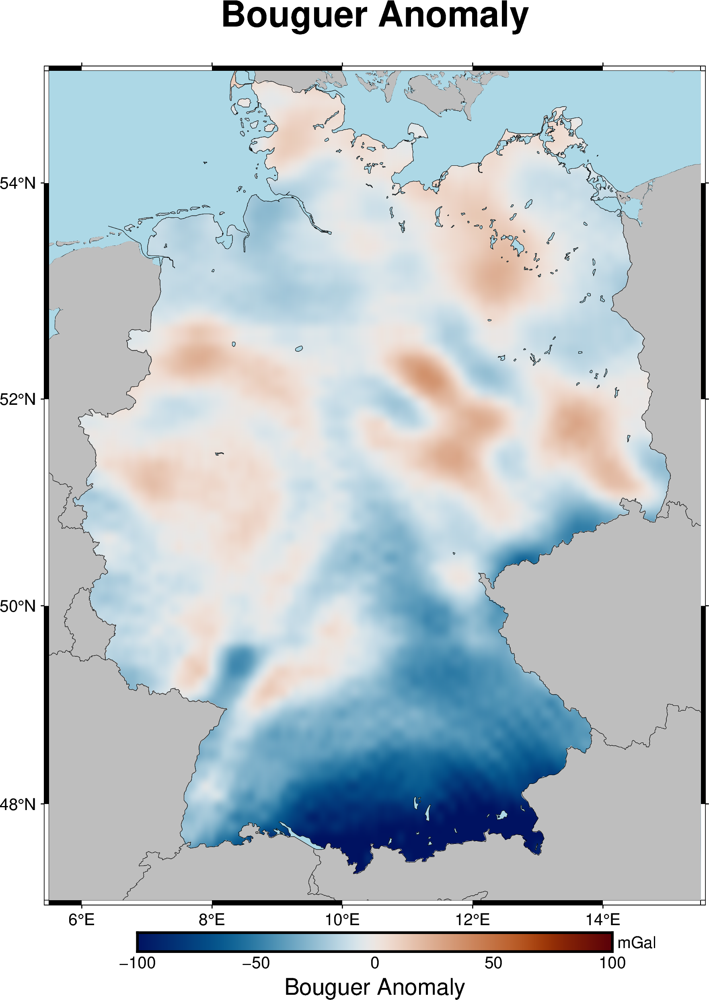

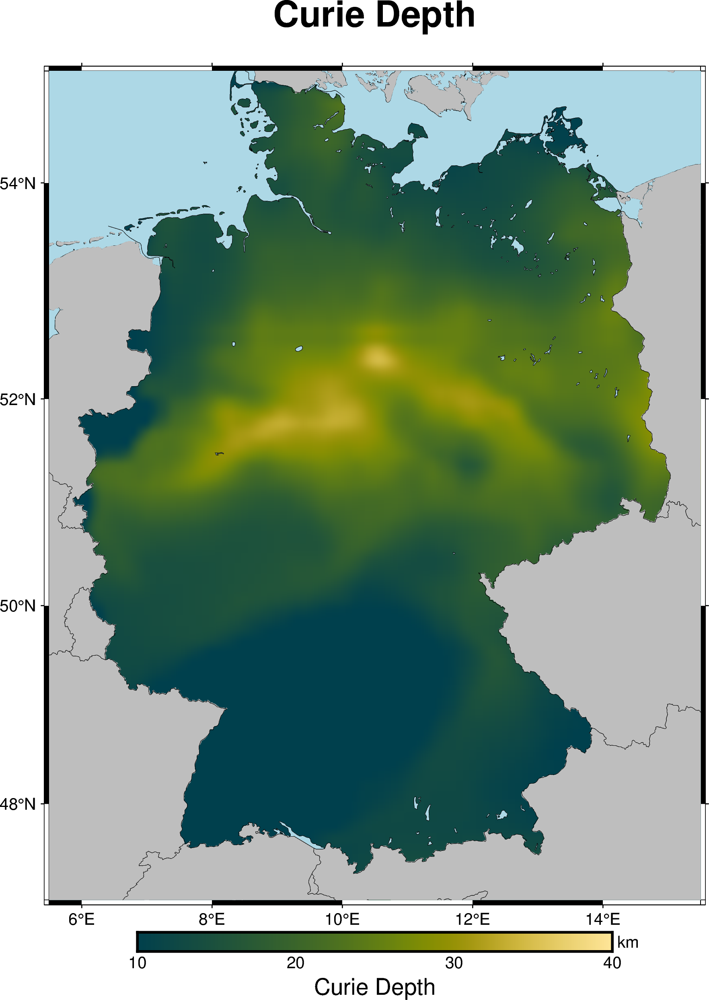

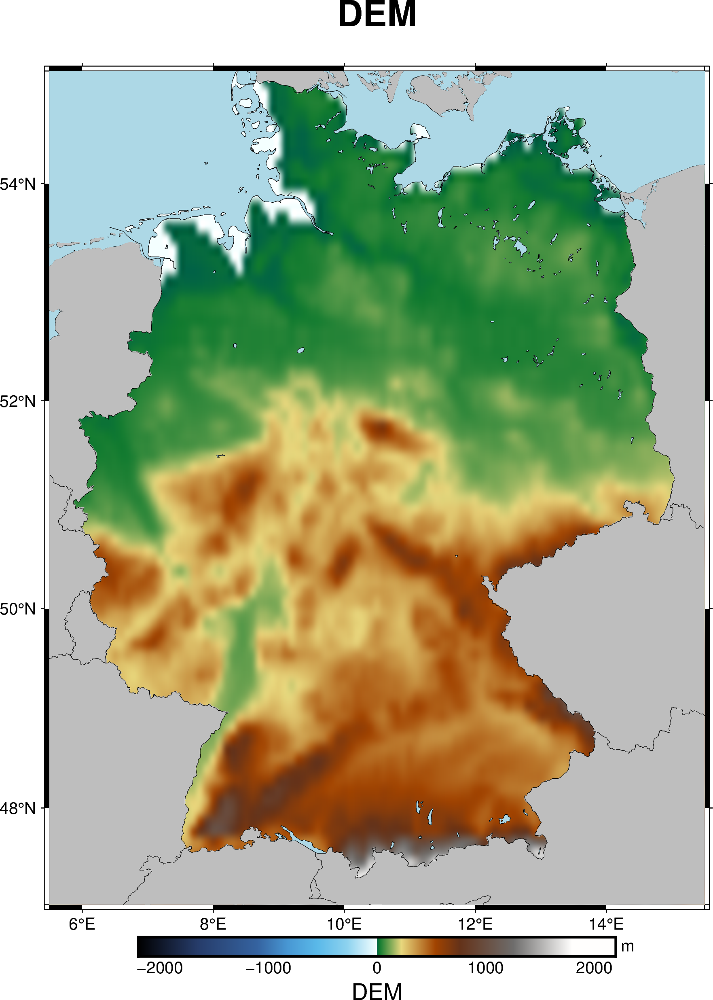

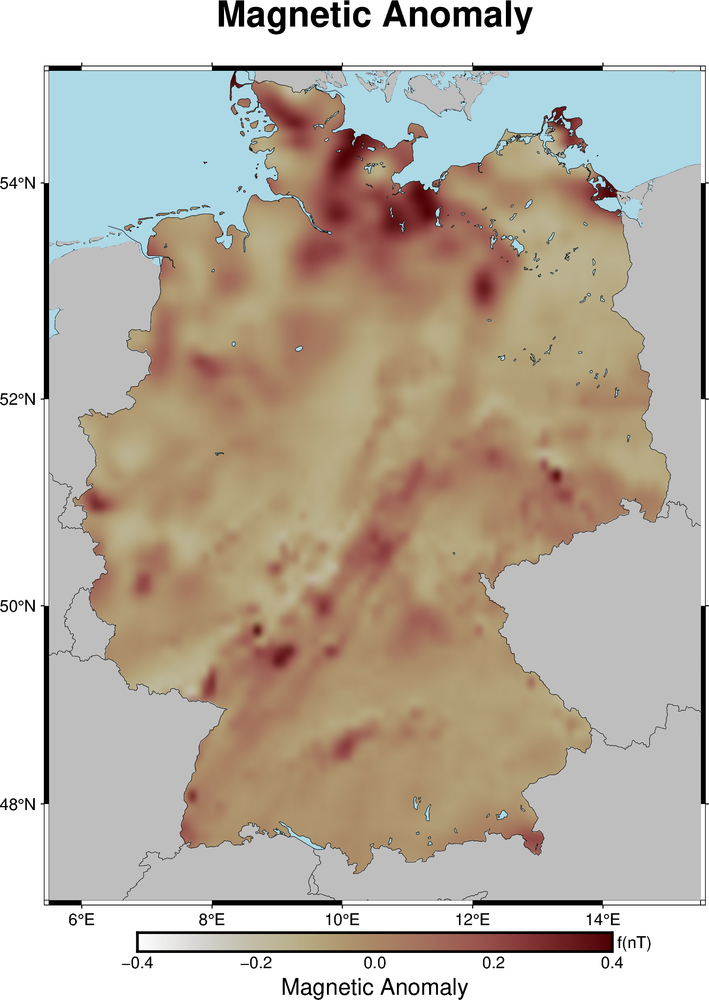

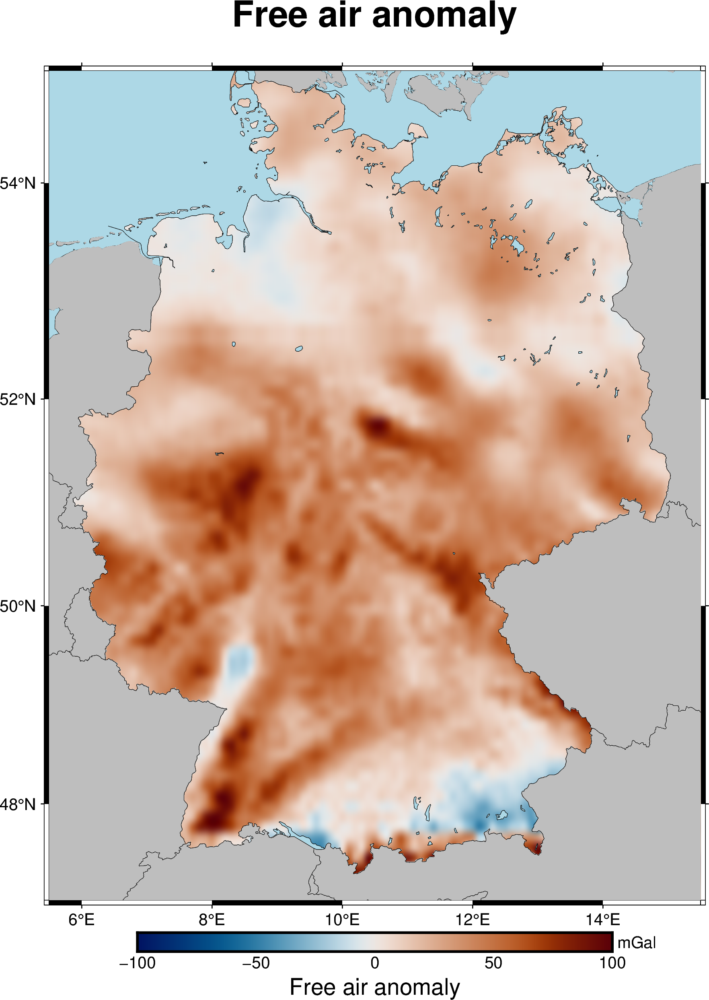

...

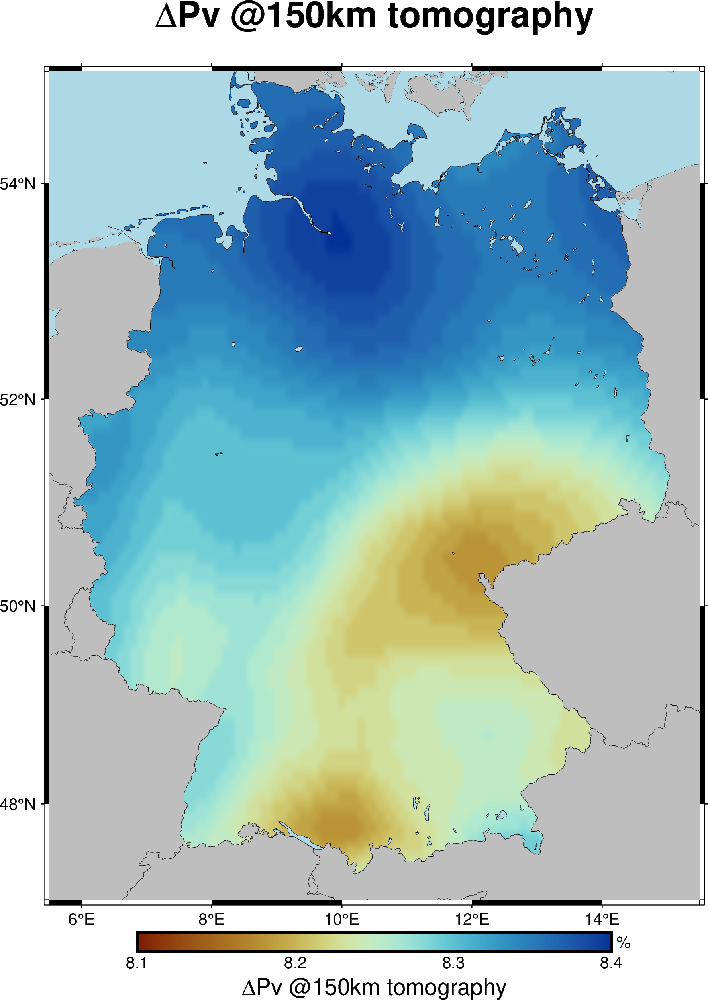

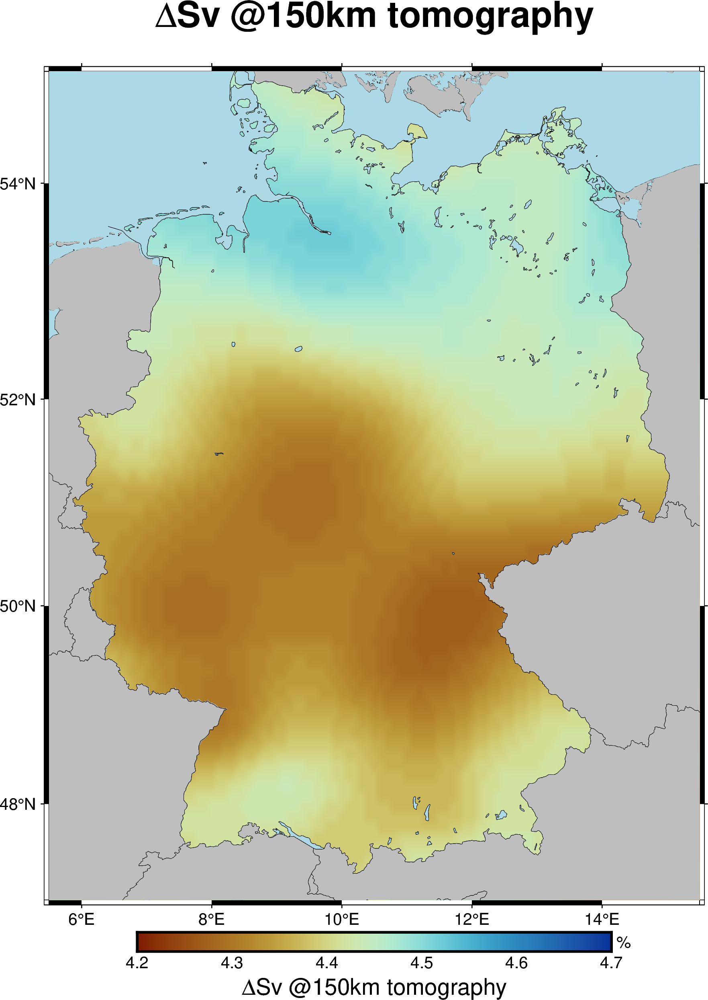

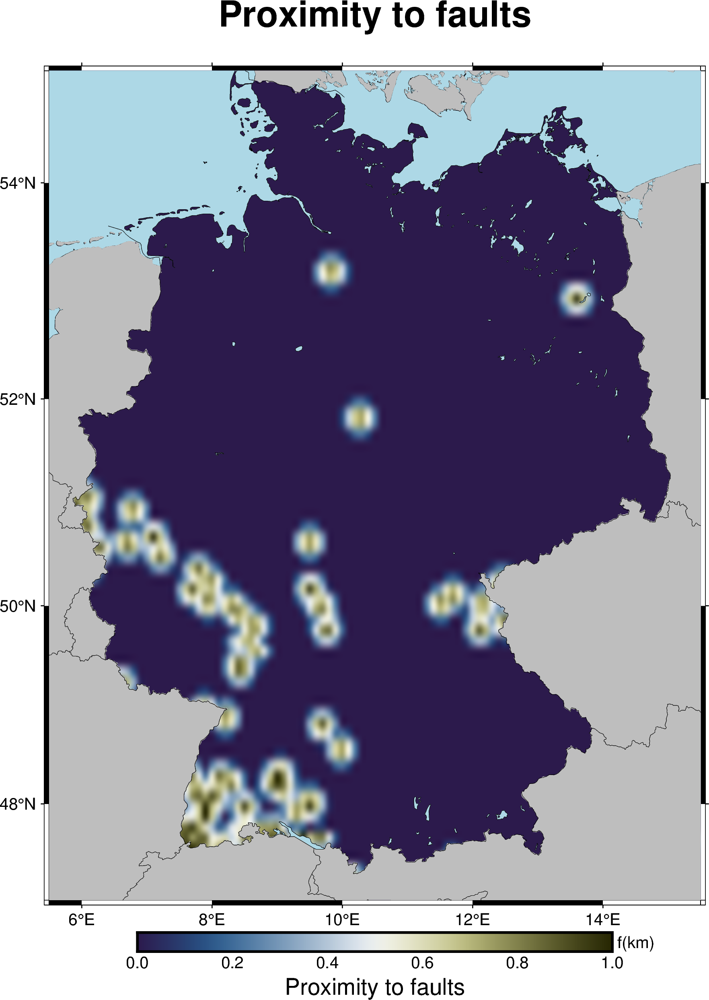

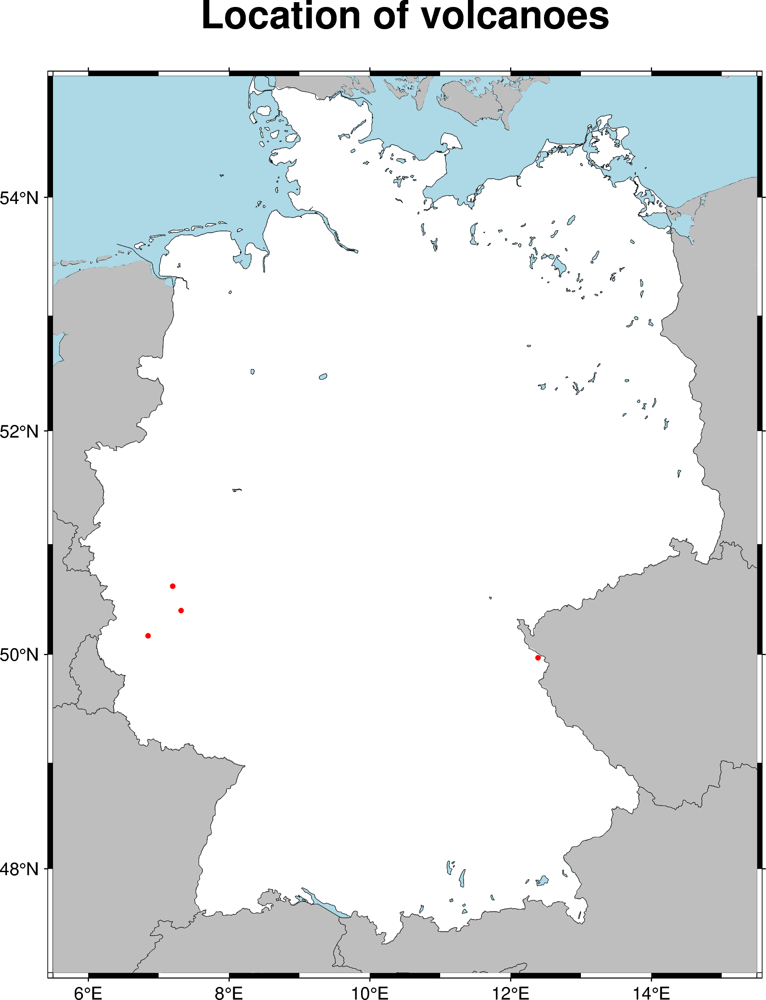

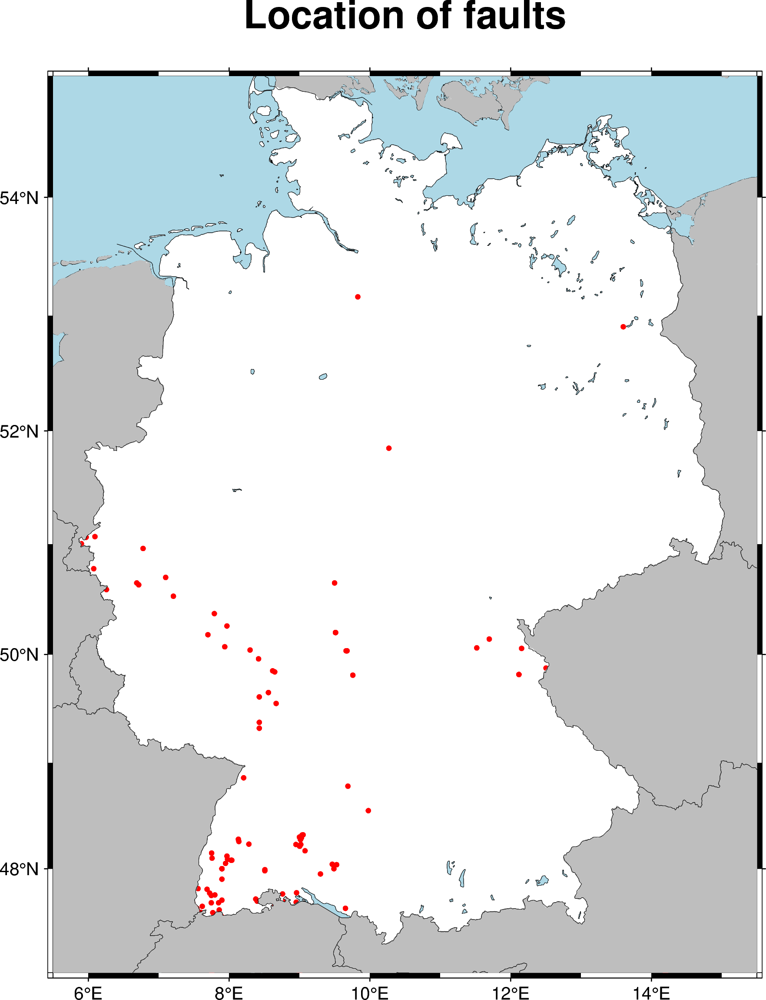

In [19]:
coast_kwargs = {
    "region": region_g_tpl,
    "projection": PROJECTION,
    "water": "lightblue",
    "shorelines": "0.1p,black",
    "borders": ["1/0.01p,black"],
    "lakes": "lightblue",
    "rivers": "lightblue",
    "dcw": "PL,FR,CH,NL,AT,DK,CZ,IT,SE,LU,BE,RO,SI,LI+ggrey",
}

base_kwargs = {
    "region": region_g_tpl,
    "projection": PROJECTION,
}

faults_points = {
    "x": stress_g_df.lon.values,
    "y": stress_g_df.lat.values,
    "style": "c0.1c",
    "color": "red"
}

volcs_points = {
    "x": volcs_g_df.lon.values,
    "y": volcs_g_df.lat.values,
    "style": "c0.1c",
    "color": "red"
}

# Loop through shared observable
for observable in tqdm_notebook(observables_lst, total=len(observables_lst), desc='Processing: '):
    if observable in ['REG', 'GLIM']:
        # Create a color palette table (cpt) for the plot and use the respective palette inside OBS
        series = (grid_g_xr[observable].min().values, grid_g_xr[observable].max().values + 1, 1)
    else:
        series = (obs_df.loc[observable, 'V_RANGE_G'][0], obs_df.loc[observable, 'V_RANGE_G'][1])

    gridimage_kwargs = {
        'grid': grid_g_xr[observable],
        "projection": PROJECTION,
        "region": region_g_tpl,
        "cmap": True,
        "interpolation": 'n+a',
        "dpi": 'i',
    }

    cmap_kwargs = {
        "cmap": obs_df.loc[observable, 'CMAPS_gmt'],
        "series": series
    }

    title = obs_df.loc[observable, 'LABELS_gmt']
    frame = ["af", f'y+l{obs_df.loc[observable, "UNITS_gmt"]}', f'x+l{obs_df.loc[observable, "LABELS_gmt"]}']
    # Create a new figure
    fig = pygmt.Figure()
    fig.basemap(**base_kwargs, frame=["a", f'+t{title}'])
    pygmt.makecpt(**cmap_kwargs)
    fig.grdimage(**gridimage_kwargs)
    fig.coast(**coast_kwargs)

    # Configure the color bar
    with pygmt.config(MAP_TICK_LENGTH=0):
        fig.colorbar(position="JCB+w10c", frame=frame)

    # Show the figure
    fig.show(width=100)

    # Save the figure
    # fig.savefig(DIR/f'Fig/{observable}.png')


# Plot volcanoes as points on map
fig = pygmt.Figure()
fig.basemap(**base_kwargs, frame=["af", "+tLocation\tof\tvolcanoes"])
fig.plot(**volcs_points)
fig.coast(**coast_kwargs)
fig.show(width=100)


# Plot volcanoes as points on map
fig = pygmt.Figure()
fig.basemap(**base_kwargs, frame=["af", "+tLocation\tof\tfaults"])
fig.plot(**faults_points)
fig.coast(**coast_kwargs)
fig.show(width=100)

# 4 - GHF

In [20]:
def process_data(ghf_in):
    # Remove records with missing position or heat flow value in long lat heat
    ghf_clean = ghf_in.dropna(subset=['lon', 'lat', TARGET])
        
    # Select ratings
    ghf_1_scored = ghf_clean.loc[ghf_clean['score'] == 1].reset_index(drop=True)    
    ghf_2_scored = ghf_clean.loc[ghf_clean['score'] <= 2].reset_index(drop=True)    
    ghf_3_scored = ghf_clean.loc[ghf_clean['score'] <= 3].reset_index(drop=True)
    ghf_4_scored = ghf_clean.loc[ghf_clean['score'] <= 4].reset_index(drop=True)
    ghf_5_scored = ghf_clean.loc[ghf_clean['score'] <= 5].reset_index(drop=True)
    ghf_6_scored = ghf_clean.loc[ghf_clean['score'] <= 6].reset_index(drop=True)


    
    ghf_dict = {
        "ghf_in": [ghf_in, f'All records (N={len(ghf_in):,})'],
        "ghf_c": [ghf_clean, f'Excluded incomplete records (N={len(ghf_clean):,})'],    
        "ghf_1": [ghf_1_scored, f'Rating = 1 (N={len(ghf_1_scored):,})'],
        "ghf_2": [ghf_2_scored, f'Rating < 2 (N={len(ghf_2_scored):,})'],
        "ghf_3": [ghf_3_scored, f'Rating < 3 (N={len(ghf_3_scored):,})'],
        "ghf_4": [ghf_4_scored, f'Rating < 4 (N={len(ghf_4_scored):,})'],
        "ghf_5": [ghf_5_scored, f'Rating < 5 (N={len(ghf_5_scored):,})'],
        "ghf_6": [ghf_6_scored, f'Rating < 6 (N={len(ghf_6_scored):,})'],
    }


    return ghf_dict


ghf_in_g_df = pd.read_excel(ghf_g_f,skiprows=3).rename(
    columns={'q': TARGET, 'lng': 'lon', 'A_QualScore': 'score', 'elevation': 'elevation (m)'})

# Mapping from scores to weights

score_to_weight = {
    6: 0.5,
    5: 0.5,
    4: 1,
    3: 1,
    2: 1,
    1: 1
}


# Replace weights based on the score

ghf_in_g_df['weights'] = 7  - ghf_in_g_df['score']
ghf_in_g_df['normalized_weights'] = ghf_in_g_df['score'].map(score_to_weight)



ghf_in_g_red_df = ghf_in_g_df[['lon', 'lat', TARGET, 'score', 'weights', 'normalized_weights']]


# Sort DataFrame by score in ascending order
df_sorted = ghf_in_g_red_df.sort_values(by='score', ascending=True)

# Remove duplicated records based on lat and lon, keeping the first (lowest score)
df_unique = df_sorted.drop_duplicates(subset=['lat', 'lon'], keep='first')

df_unique.reset_index(drop=True, inplace=True)


# Process GHF data for each region and elevation cut
ghfs_dicts_g_lst = [process_data(ghf_in) 
             for ghf_in in tqdm_notebook([df_unique], desc='Processing GHF: ')]


logging.info('Terminated')



Processing GHF:   0%|          | 0/1 [00:00<?, ?it/s]

2024-08-14 23:43:22,658 - INFO - Terminated


# 5 - Merge GHF with other observables

In [21]:
preprocessed_dir = DIR /'Dataset'/'Preprocessed'



# Calculate the Euclidean distance between two points without math.dist
def euclidean_distance(p1, p2):
    return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)


# Max distance for points in 0.5x0.5 grid spacing is the diagonal distance
#GHF_MAX_DIST = math.dist([SPACING/2, 0], [0, SPACING/2])    
GHF_MAX_DIST = euclidean_distance([SPACING/2, 0], [0, SPACING/2])


# Define a function to merge observable from grid with GHF
def merge_observable(grid, ghf, dist_index):
    for observable in grid.data_vars:
        #allocate pixels where heat flow points exisit inside grid
        filtered_indices = ghf[dist_index]
        ghf[observable] = grid[observable].values.ravel()[filtered_indices]
    return ghf


for key, ghf_in in tqdm_notebook(ghfs_dicts_g_lst[0].items(), total=2, desc='Processing: '):
    sleep(0.01)

    ghf = ghf_in[0]
    ghf_coords    = np.column_stack([ghf['lon'], ghf['lat']])

    logging.info('Germany')
    #flatten all pixels
    grid_g_coords = np.column_stack([grid_g_xr.lon.values.ravel(), grid_g_xr.lat.values.ravel()])

    # search based on distance      
    _, indices = spatial.KDTree(grid_g_coords).query(ghf_coords, distance_upper_bound=GHF_MAX_DIST)

    valid_indices = indices < grid_g_coords.shape[0]  # Filter out invalid indices
    ghf = ghf[valid_indices]

    #make sure indices are int not float
    ghf[GRID_INDEX_G] = indices[valid_indices].astype('int')

    #clculate ditances from GHF points and GHF pixels
    ghf['dist_from_grid_g'] = utils.geodinv(
        ghf['lon'], 
        ghf['lat'], 
        grid_g_xr.lon.values.ravel()[indices[valid_indices]], 
        grid_g_xr.lat.values.ravel()[indices[valid_indices]]
    ).astype('float') #make sure indices are int not float


    #extract observables at grid pixels
    ghf_merged = merge_observable(grid_g_xr, ghf, 'grid_index')

    #save for Germany
    ghf_merged.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)

    ghf_merged.to_csv(preprocessed_dir / f'{key}_int.csv' , index=False, header=True, sep='\t')


logging.info('Terminated')

Processing:   0%|          | 0/2 [00:00<?, ?it/s]

2024-08-14 23:43:22,925 - INFO - Germany
2024-08-14 23:43:22,974 - INFO - Germany
2024-08-14 23:43:23,039 - INFO - Germany
2024-08-14 23:43:23,068 - INFO - Germany
2024-08-14 23:43:23,099 - INFO - Germany
2024-08-14 23:43:23,129 - INFO - Germany
2024-08-14 23:43:23,168 - INFO - Germany
2024-08-14 23:43:23,216 - INFO - Germany
2024-08-14 23:43:23,254 - INFO - Terminated


In [22]:
#export maps as xarray
grid_g_xr.to_netcdf(DIR/'Grids'/ "grid_g.nc", mode='w', engine='netcdf4')


# Check health of data

Data Overview:

Missing Values:
BG               0
CTD_vb35         0
DEM              0
MAG_CLASS        0
FA               0
GEOID_A          0
LAB              0
MOHO             0
RHO_L            0
SEDIMENT         0
SI               0
VOLCS_DIST_W     0
VP               0
VS               0
STRESS_DIST_W    0
GHF              0
dtype: int64


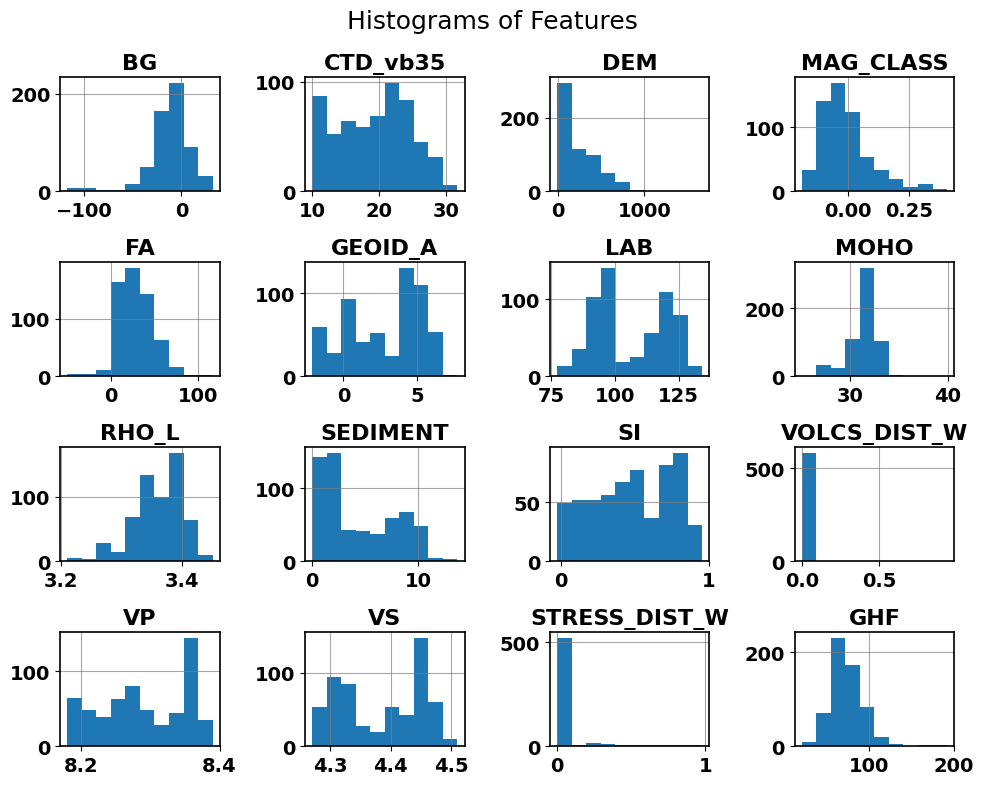

In [23]:

# 1. Data Overview
# Display the first few rows of the dataset
print("Data Overview:")
#print(ghf_merged[observables_ghf_lst].head())


# . Check for Missing Values
# Check for any missing values in each column
print("\nMissing Values:")
print(ghf_merged[observables_ghf_lst].isnull().sum())


# Visualizations

# 1. Histogram for each feature
# Plot histograms to visualize the distribution of each feature
ghf_merged[observables_ghf_lst].hist(figsize=(10, 8))
plt.suptitle('Histograms of Features')
plt.tight_layout()
plt.show()



In [24]:

# 3. Statistical Summary
# Display statistical summary of the dataset
print("\nStatistical Summary:")
ghf_merged[observables_ghf_lst].describe()




Statistical Summary:


,BG,CTD_vb35,DEM,MAG_CLASS,FA,GEOID_A,LAB,MOHO,RHO_L,SEDIMENT,SI,VOLCS_DIST_W,VP,VS,STRESS_DIST_W,GHF
count,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000,595.000000
mean,-12.241849,19.050672,241.052941,-0.008391,28.269378,2.831798,106.243076,31.343893,3.359529,4.281025,0.482023,0.010913,8.289378,4.384303,0.060570,73.255971
std,21.775873,5.515543,227.489209,0.101725,19.762221,2.538924,14.284888,1.645700,0.042360,3.527890,0.267388,0.085487,0.059451,0.068711,0.183257,19.900284
min,-116.960000,10.000000,-8.000000,-0.186915,-49.510000,-2.120000,77.230000,25.060488,3.210000,0.000000,-0.027993,0.000000,8.180000,4.270000,0.000000,20.000000
25%,-19.750000,14.790000,54.500000,-0.077748,15.200000,0.645000,94.170000,30.886918,3.330000,1.465000,0.256232,0.000000,8.240000,4.320000,0.000000,61.000000
50%,-10.460000,19.790000,168.000000,-0.027494,26.100000,3.780000,101.520000,31.576782,3.360000,3.120000,0.511180,0.000000,8.290000,4.400000,0.000000,71.000000
75%,-0.230000,23.360000,375.500000,0.025278,41.815000,4.840000,120.810000,32.205675,3.400000,7.860000,0.745630,0.000000,8.350000,4.450000,0.000000,83.850000
max,31.900000,31.630000,1669.000000,0.402862,116.690000,7.720000,134.280000,39.930000,3.450000,13.690000,0.956502,0.935364,8.390000,4.510000,0.978862,192.000000


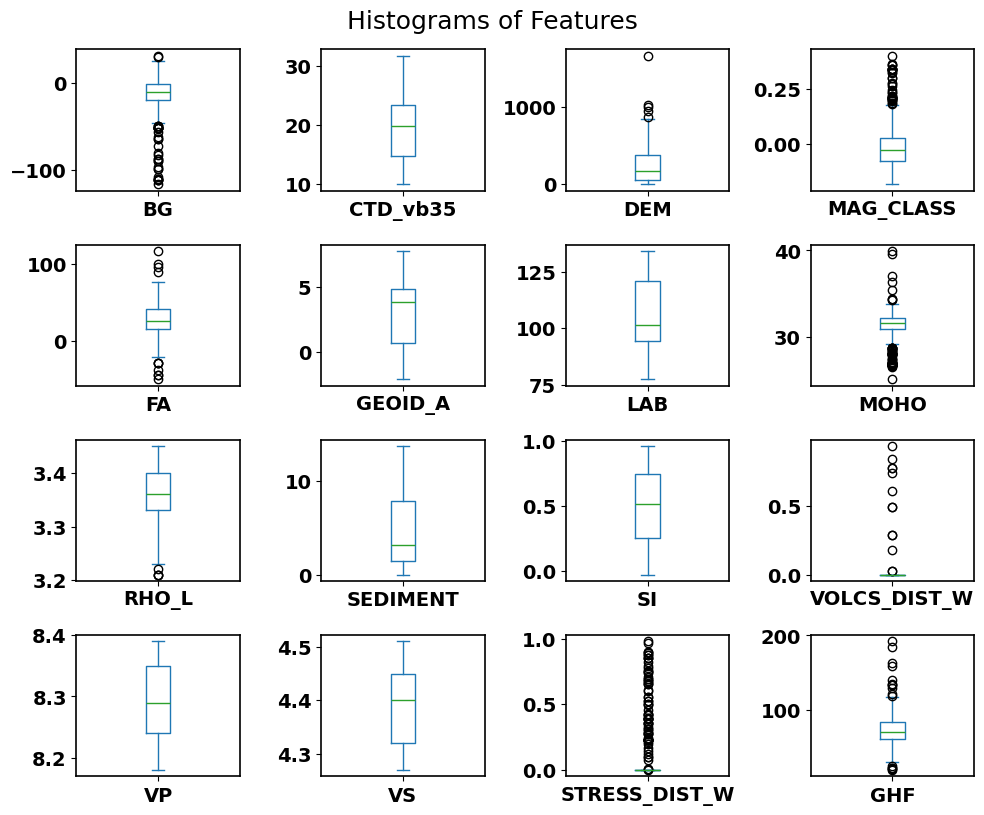

In [25]:

# 2. Boxplot to check for outliers
# Plot boxplots to visualize outliers and spread of each feature
ghf_merged[observables_ghf_lst].plot(kind='box', subplots=True, layout=(5, 4), figsize=(10, 10), sharex=False, sharey=False, title='Boxplot of Features')
plt.suptitle('Boxplots of Features')
plt.suptitle('Histograms of Features')
plt.tight_layout()
plt.show()




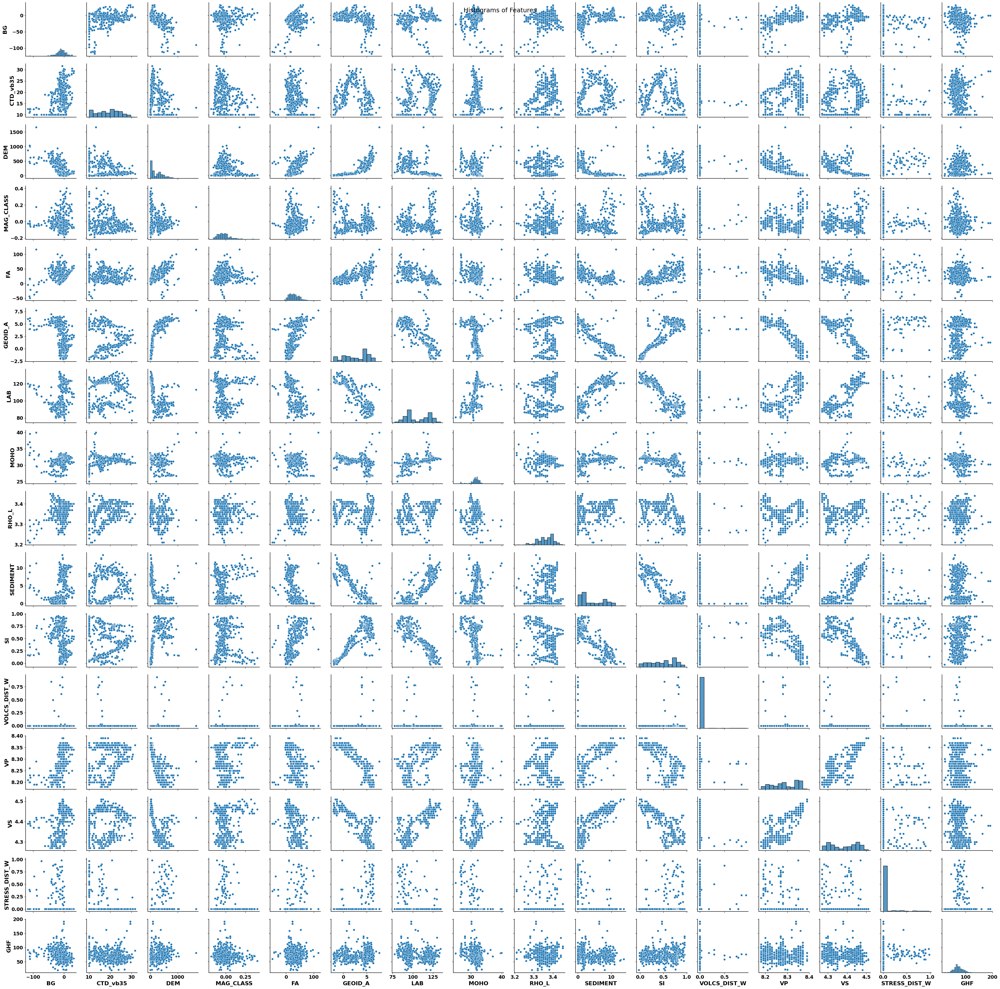

In [26]:
# 3. Pairplot to visualize relationships between features
# Use seaborn's pairplot to visualize pairwise relationships between features
sns.pairplot(ghf_merged[observables_ghf_lst])
plt.suptitle('Pairplot of Features', y=1.02)
plt.suptitle('Histograms of Features')
plt.tight_layout()
plt.show()





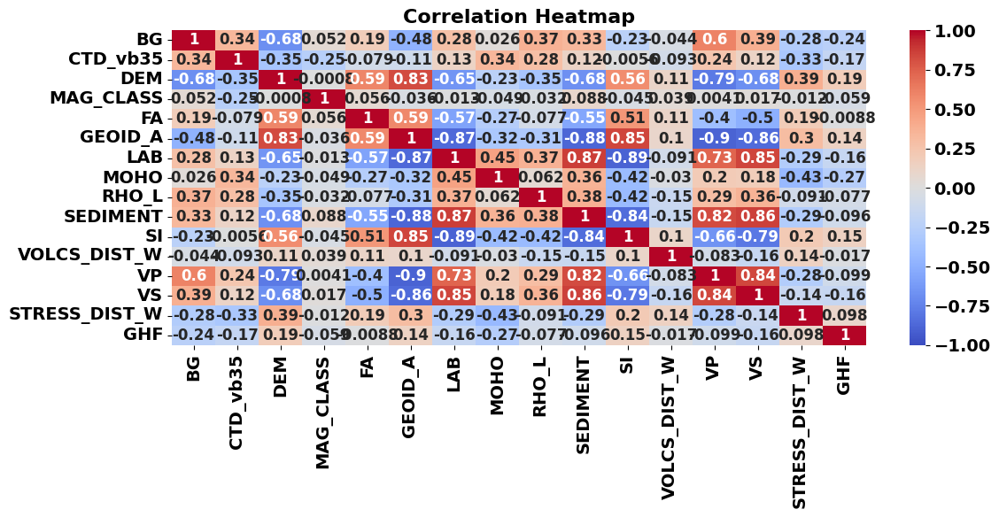

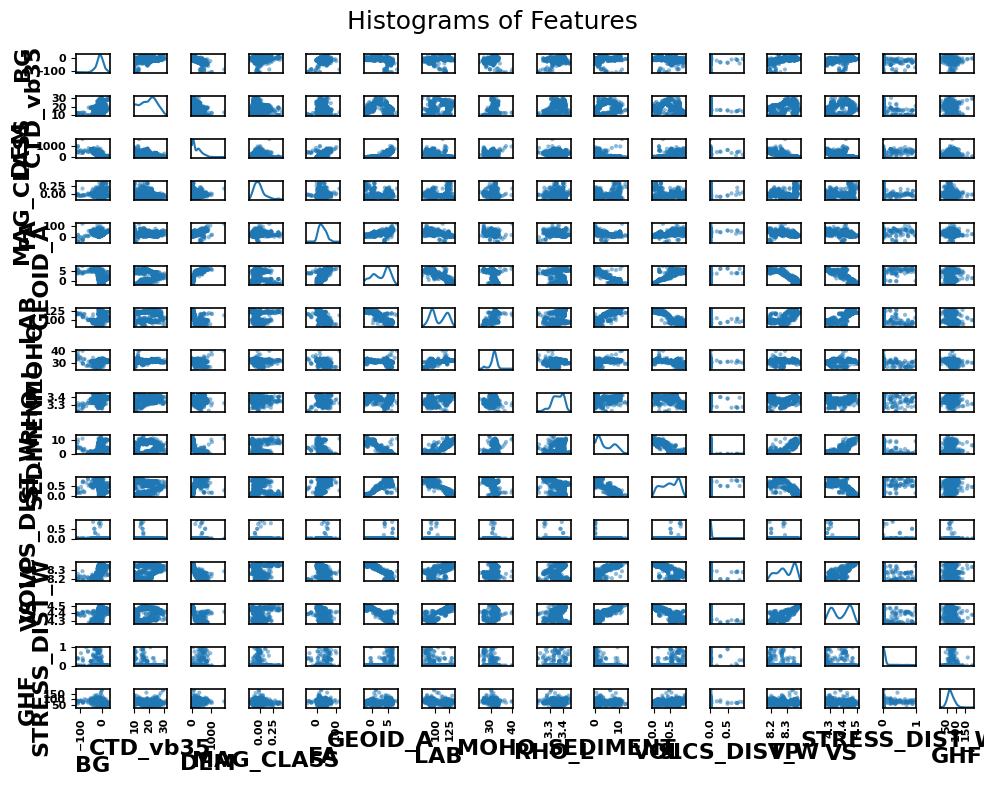

In [27]:
# 4. Correlation Heatmap
# Plot heatmap of the correlation matrix to visualize relationships between features
plt.figure(figsize=(12, 6))
correlation_matrix = ghf_merged[observables_ghf_lst].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()



# 5. Scatter plot matrix (alternative to pairplot)
# Use pandas' scatter_matrix to visualize pairwise scatter plots with kernel density estimates on the diagonal
pd.plotting.scatter_matrix(ghf_merged[observables_ghf_lst], figsize=(10, 8), diagonal='kde')
plt.suptitle('Scatter Matrix of Features')
plt.suptitle('Histograms of Features')
plt.tight_layout()
plt.show()